In [ ]:
#pip install photutils
#pip install astroquery

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import glob
from scipy.spatial.distance import cdist
import cv2
import sys
import pandas as pd
from IPython.display import display
from datetime import datetime

from astroquery.simbad import Simbad
from astroquery.vizier import Vizier
from photutils.aperture import ApertureStats, aperture_photometry, CircularAperture, CircularAnnulus
from photutils.detection import DAOStarFinder, find_peaks
from astropy.io import fits
from astropy.stats import sigma_clipped_stats
from astropy.table import vstack, Table, Column
from astropy.wcs import WCS
import astropy.units as u
from astropy.coordinates import SkyCoord

sys.path.append('/home/finn/visual_Studio_Code/bachelorarbeit/')
from phot_used_functions import filter_sources, determine_distance, determine_shift, determine_magnitudes, determine_fwhm
from phot_used_functions import import_images
from plotting import show_image

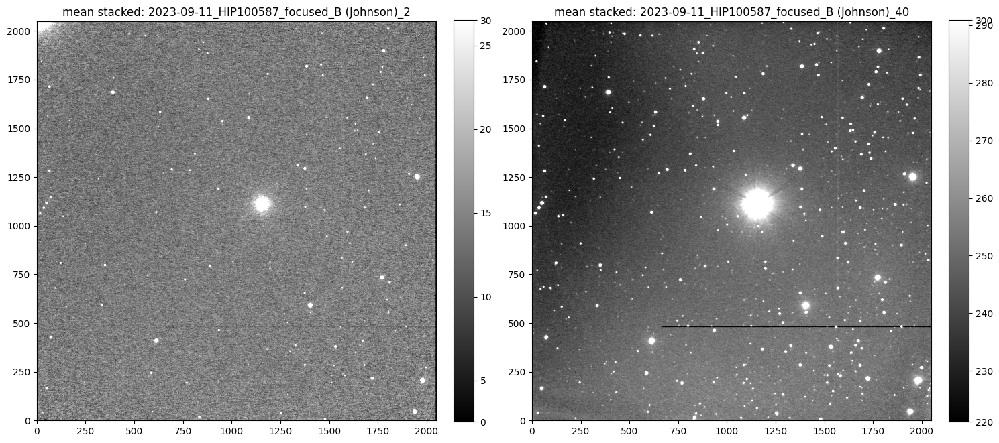

In [4]:
## from phot_used_functions import import_images

path_short = '/home/finn/visual_Studio_Code/data/2023-09-11/stacked/lightCor_HIP100587_focused_B (Johnson)_2.0s_10_images_stacked_'
path_long ='/home/finn/visual_Studio_Code/data/2023-09-11/stacked/lightCor_HIP100587_focused_B (Johnson)_40.0s_10_images_stacked_'
path_short_median = '/home/finn/visual_Studio_Code/data/2023-09-11/stacked_old/lightCor_HIP100587_focused_B (Johnson)_2.0s_long_short_10_images_stacked_'
path_long_median = '/home/finn/visual_Studio_Code/data/2023-09-11/stacked_old/lightCor_HIP100587_focused_B (Johnson)_40.0s_long_short_10_images_stacked_'



     
image_list_long, header_list_long, titles_long, exptime_long = import_images(path_long)
image_list_short, header_list_short, titles_short, exptime_short = import_images(path_short)
image_list_long_median, header_list_long_median, titles_long_median, exptime_long_median = import_images(path_long_median)
image_list_short_median, jheader_list_short_median, titles_short_median, exptime_short_median = import_images(path_short_median)

middle = len(image_list_short)//2
image_short = image_list_short_median[middle]
image_long = image_list_long_median[middle]

w_short = WCS(header_list_short[middle]) #use mean images wcs because i didnt solved for median yet
w_long = WCS(header_list_long[middle])


fig, ax = plt.subplots(1, 2, figsize=(15, 30))
show_image(image_short, fig=fig, ax=ax[0])
show_image(image_long , fig=fig, ax=ax[1])
ax[0].set_title(f'mean stacked: {titles_short[middle]}')
ax[1].set_title(f'mean stacked: {titles_long[middle]}')
plt.tight_layout()

[-15.663425480302838, -15.677201851152937, -15.647694947139277, -15.452239565612187, -15.31108147077805, -15.69276346560083, -15.646220356282832]
0.13448167806202418
[array([[ 984.60764713, 1015.94020408]]), array([[ 998.21819266, 1023.50890062]]), array([[1018.93564413, 1034.95682611]]), array([[1054.55641475, 1050.98556421]]), array([[1075.25792481, 1059.08474469]]), array([[1092.66746739, 1069.25096002]]), array([[1120.51149411, 1073.42607163]])]
[-15.67528258096557, -15.687385527122988, -15.65358640440042, -15.466526211580131, -15.407210474279722, -15.708217046456278, -15.661278111426011]
0.11091738979187783
[array([[ 984.62944866, 1015.94203271]]), array([[ 998.19392005, 1023.51289304]]), array([[1018.92720659, 1034.94291029]]), array([[1054.54654122, 1051.01729623]]), array([[1075.24113696, 1059.07086642]]), array([[1092.69988472, 1069.24042213]]), array([[1120.52590063, 1073.41957438]])]


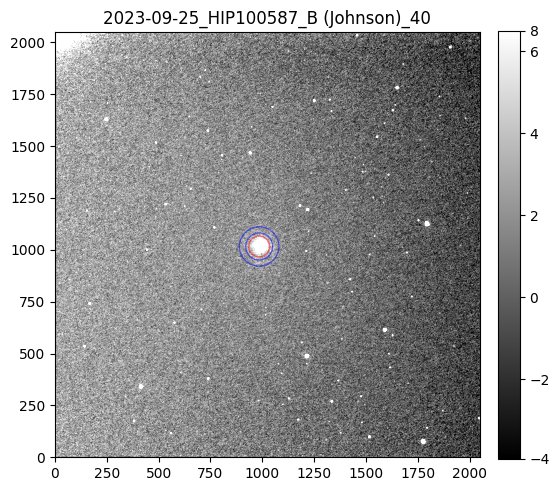

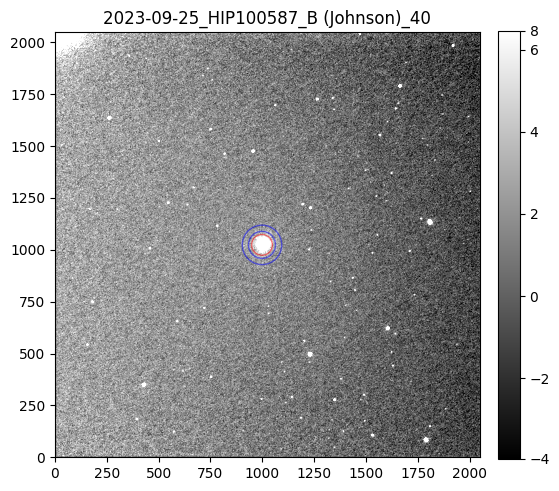

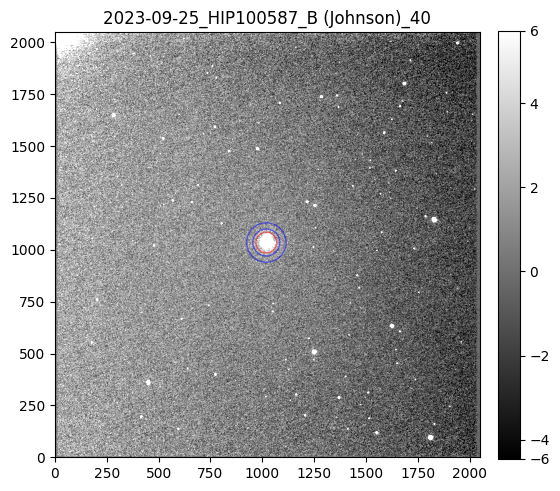

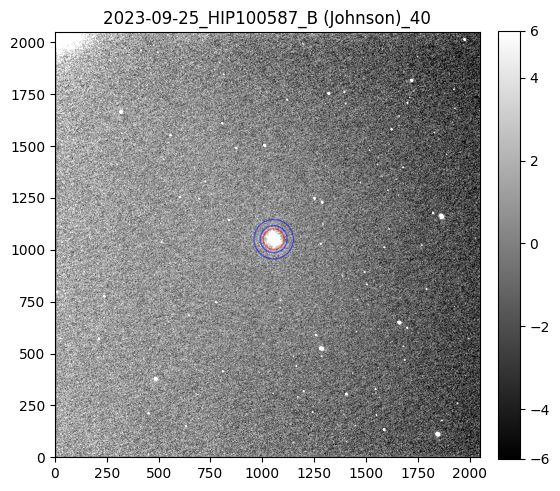

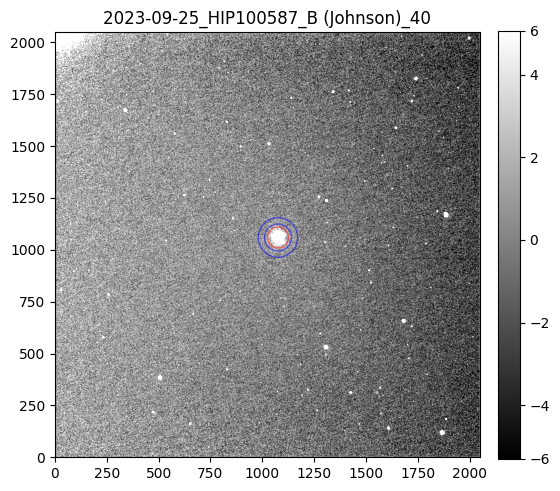

...

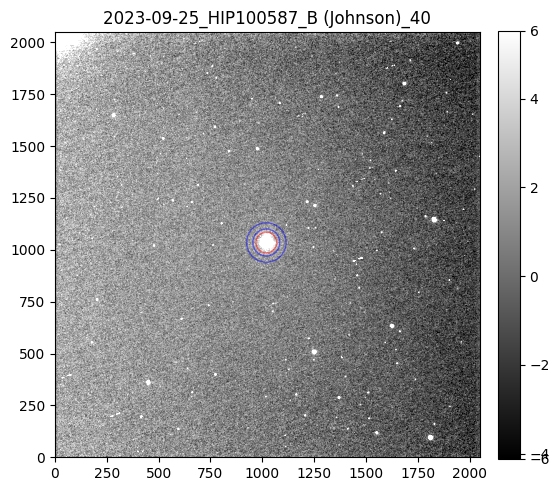

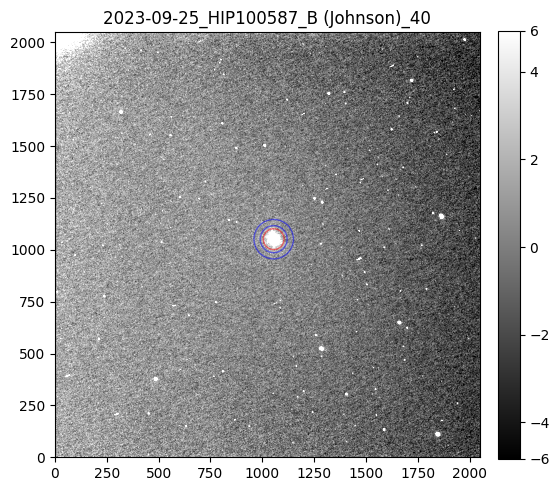

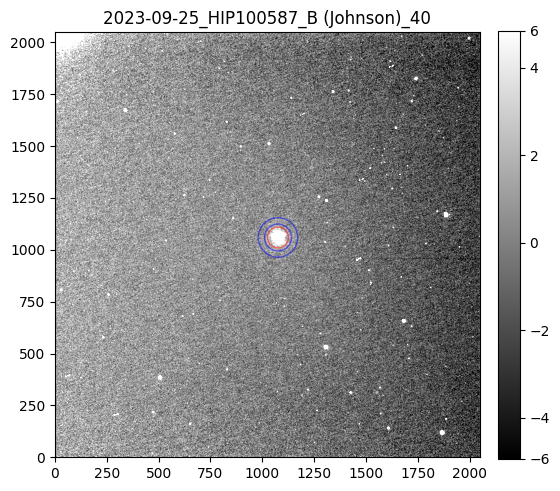

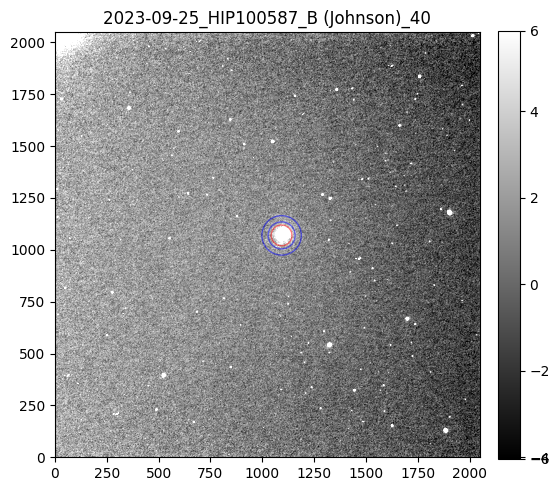

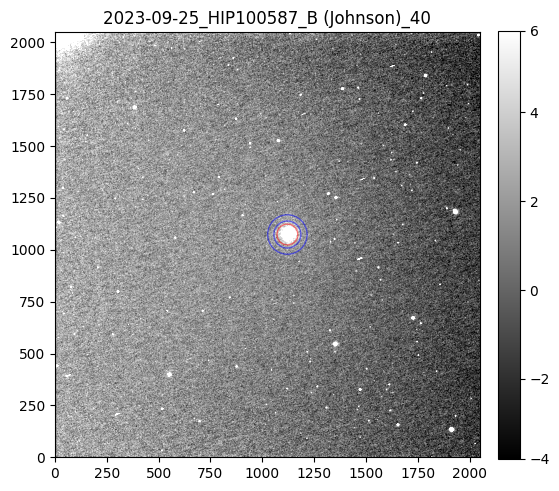

In [45]:
radius_bright = 50
def get_mag_bright(image_list, apperture_radius=60): #default value of the apperture radius is 60 but need to be changed below
    positions_bright, magnitude_list_bright = [], []

    for i, image in enumerate(image_list):
        mean, median, std = sigma_clipped_stats(image, sigma=3.0)
        daofind = DAOStarFinder(fwhm=5.0, threshold=5.0*std, roundlo=-5.0, roundhi=5.0,brightest=1) #roundlo and roundhi to adjust detection shape. need to be
        sources = daofind(image)
        positions = np.transpose((sources['xcentroid'], sources['ycentroid']))
        fig, ax = plt.subplots(1,1, figsize=(6,6))
        show_image(image, fig=fig, ax=ax)
        ax.set_title(titles_long[i])
        magnitudes = determine_magnitudes(image, positions=positions, star_radius=apperture_radius, exptime=exptime_short)
        magnitude_list_bright.append(magnitudes)
        positions_bright.append(positions)
    print(magnitude_list_bright)
    print(np.std(magnitude_list_bright))
    print(positions_bright)
    return positions_bright, magnitude_list_bright

pos_br_median, mag_br_median = get_mag_bright(image_list_short_median, apperture_radius=radius_bright)
pos_br_mean, mag_br_mean = get_mag_bright(image_list_short, apperture_radius=radius_bright)

In [13]:
#should be the same theoretically 
print(pos_br_mean)
print(pos_br_median)

[array([[ 984.62944866, 1015.94203271]]), array([[ 998.19392005, 1023.51289304]]), array([[1018.92720659, 1034.94291029]]), array([[1054.54654122, 1051.01729623]]), array([[1075.24113696, 1059.07086642]]), array([[1092.69988472, 1069.24042213]]), array([[1120.52590063, 1073.41957438]])]
[array([[ 984.60764713, 1015.94020408]]), array([[ 998.21819266, 1023.50890062]]), array([[1018.93564413, 1034.95682611]]), array([[1054.55641475, 1050.98556421]]), array([[1075.25792481, 1059.08474469]]), array([[1092.66746739, 1069.25096002]]), array([[1120.51149411, 1073.42607163]])]
7


In [5]:
# determine the shifts between images (other version at bottom of document)
shifts_long = determine_shift(image_list_long_median)
shifts_short = determine_shift(image_list_long_median)
#should be comperable
print(shifts_long)
print(shifts_short)

Number of images to process: 7
we use image:  3 from given list as reference image
Number of images to process: 7
we use image:  3 from given list as reference image
[(-3.22699, -0.46748975), (-56.84429, -26.464834), (-18.27333, -8.5458555), (0, 0), (22.589134, 8.672929), (36.56433, 18.316496), (63.524822, 22.466795)]
[(-3.22699, -0.46748975), (-56.84429, -26.464834), (-18.27333, -8.5458555), (0, 0), (22.589134, 8.672929), (36.56433, 18.316496), (63.524822, 22.466795)]


184
184
184
184
184
184
184
[-1.270184639259621, -6.2021119714712105, -6.181514116946446, -5.986995429955667, -5.9436761126690385, -6.223022010713682, -6.199391375054688]
1.7012578068848452
184
184
184
184
184
184
184
[-1.3140004824708817, -6.196003627730445, -6.178940203187016, -5.9804450207170925, -5.8373907195266135, -6.218136067575703, -6.165315893723854]
1.6783444505124507


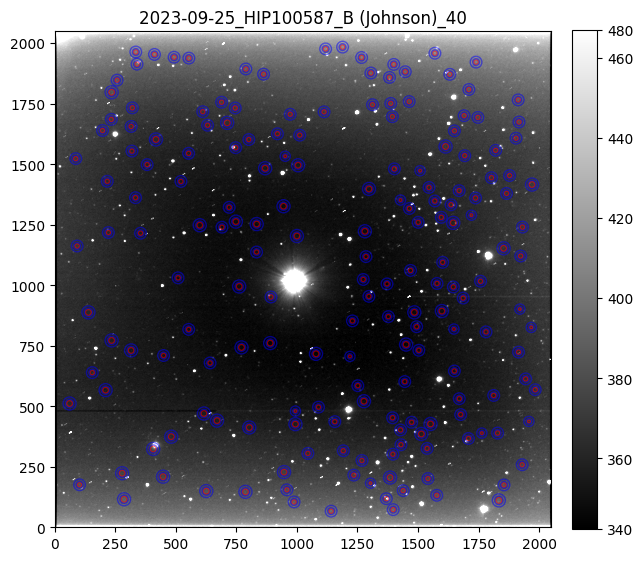

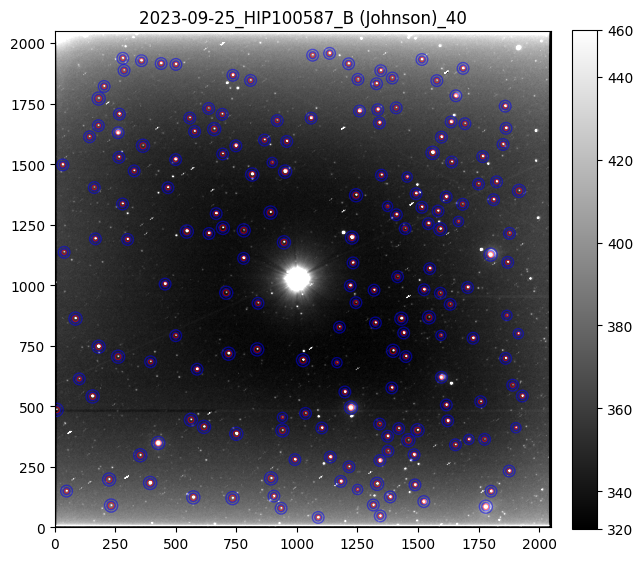

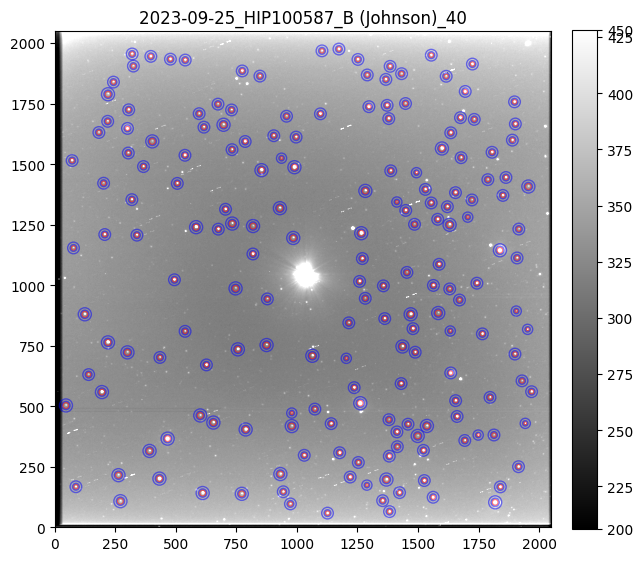

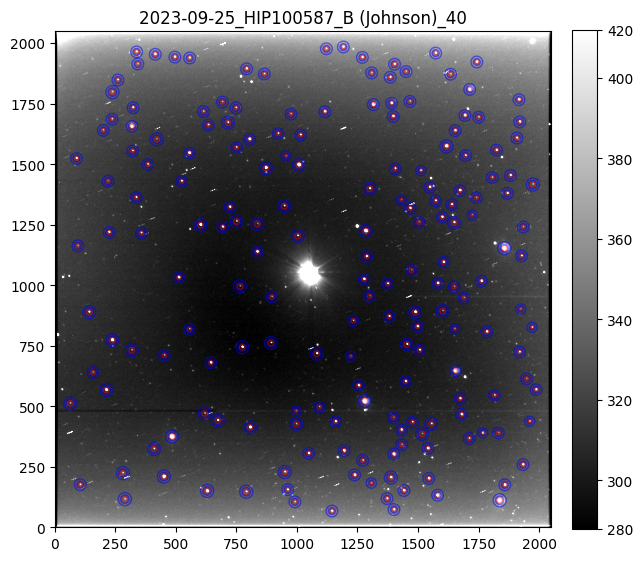

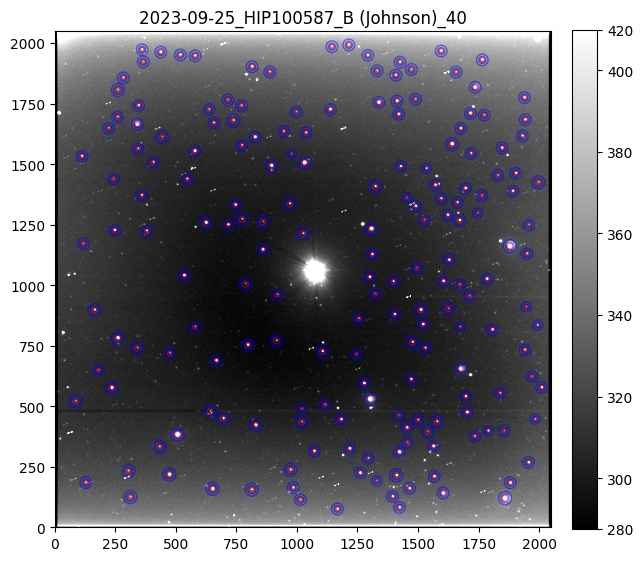

...

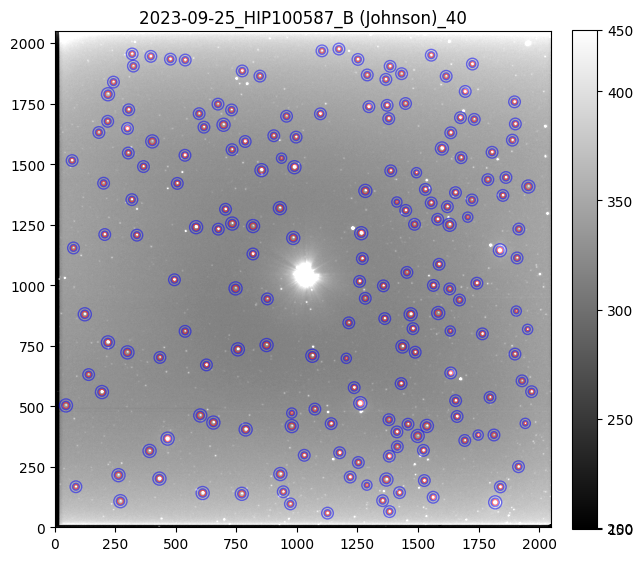

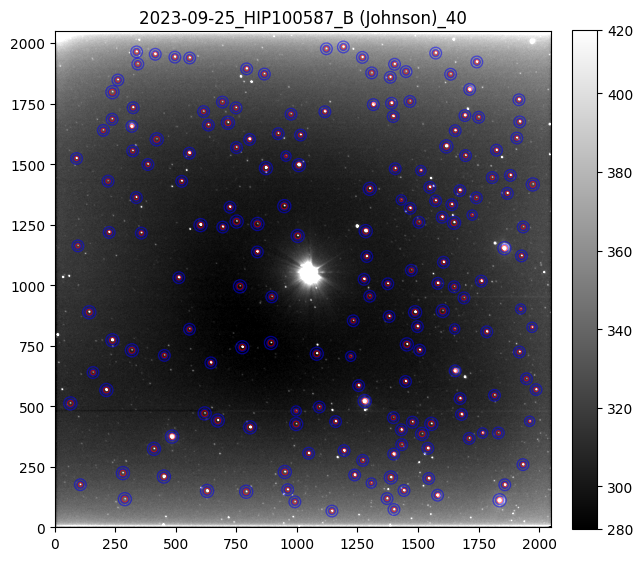

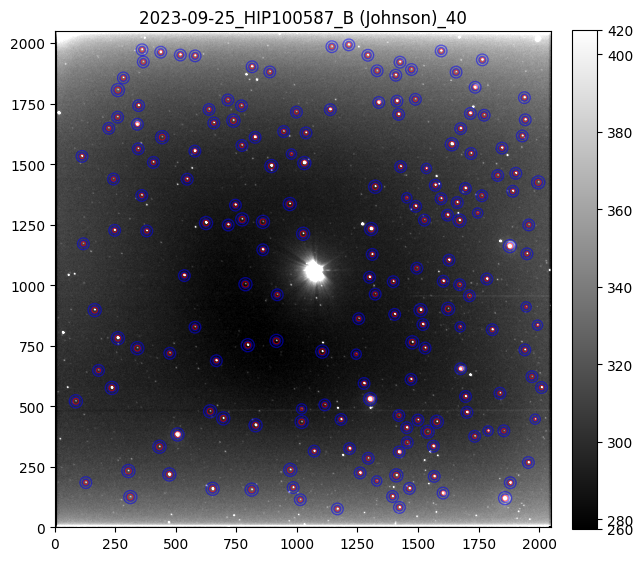

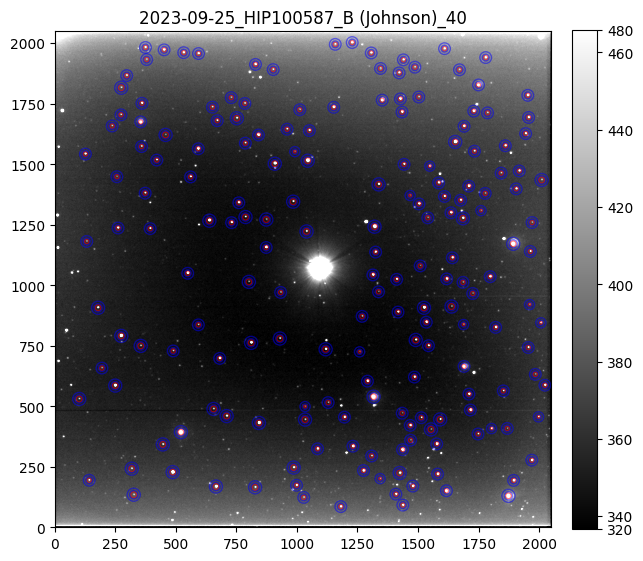

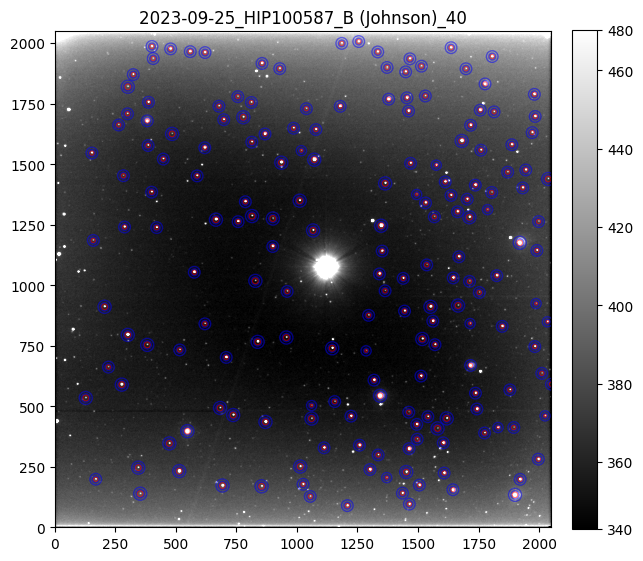

In [46]:
def get_mag_faint(image_list, threshold_value = 3):
    magnitude_list_faint, positions_faint = [], []

    mask = np.zeros(image_long.shape, dtype=bool)
    x, y = np.ogrid[:image_long.shape[1], :image_long.shape[0]]
    circle_mask = np.sqrt((x - pos_br_median[middle][0][1]) ** 2 + (y - pos_br_median[middle][0][0]) ** 2) <= (radius_bright+100)
    mask[circle_mask] = True

    mean, median, std = sigma_clipped_stats(image_long, sigma=3.0)
    daofind = DAOStarFinder(fwhm=3.0, threshold=threshold_value*std, roundlo=-5.0, roundhi=5.0) #roundlo and roundhi to adjust detection shape. need to be calibrated
    sources = daofind(image_long, mask=mask) 
    sources.sort(['xcentroid', 'ycentroid'])
    positions = np.transpose((sources['xcentroid'], sources['ycentroid']))
    # Exclude multiple detections and stars which are to close to edge or each other (keep the brightest star)
    positions,sources = filter_sources(positions, sources, min_edge_distance=60)
    #determine individual radii for apertures
    valid_positions, fwhm = determine_fwhm(image_long, positions,max_value=10)
    radii = [value * 3 for value in fwhm]  # aperture size should be 3 * FWHM
    #valid_positions = positions
    #radii = 8*np.ones(len(valid_positions))

    for i,image in enumerate (image_list):
        shifted_positions = []
        for position in valid_positions:
            tuple = np.array((position[0]+shifts_long[i][0], position[1]+shifts_long[i][1]))
            #tuple = np.array((position[0]+shifts_alternative[i][0][0], position[1]+shifts_alternative[i][0][1]))
            shifted_positions.append(tuple)
        print(len(shifted_positions))

        fig, ax = plt.subplots(1,1, figsize = (7,7))
        show_image(image, fig=fig, ax=ax)
        ax.set_title(titles_long[i])
        apertures_faint = [CircularAperture(position, r=r) for position, r in zip(shifted_positions, radii)]
        annulus_apertures_faint = [CircularAnnulus(position,r_in=radius+5, r_out=radius+15) for position,radius in zip(shifted_positions,radii)]
        for aperture in apertures_faint:
            aperture.plot(color="red", lw=1.0, alpha=0.5)
        for anulus in annulus_apertures_faint:
            anulus.plot(color="blue", lw=1.0, alpha=0.5)

        # Initialize an empty table to store the photometry results
        phot_table_faint = Table(names=('id', 'xcenter', 'ycenter', 'aperture_sum', 'total_bkg'), dtype=('int', 'float', 'float', 'float', 'float'))
        for j in range(len(apertures_faint)):
            aperstats = ApertureStats(image, annulus_apertures_faint[j])
            bkg = aperstats.median
            aperture_area = apertures_faint[j].area_overlap(image)
            total_bkg = bkg * aperture_area
            phot_table = aperture_photometry(image, apertures_faint[j])
            phot_table['total_bkg'] = total_bkg
            phot_table_faint.add_row([j, phot_table['xcenter'][0], phot_table['ycenter'][0], phot_table['aperture_sum'][0], phot_table['total_bkg'][0]])
        magnitudes=[]
        for row in phot_table_faint:
            magnitude =  - (2.5 * np.log10(abs(row['aperture_sum'] - row['total_bkg']) / exptime_long))
            magnitudes.append(magnitude)
        magnitude_list_faint.append(magnitudes)
        positions_faint.append(shifted_positions)


    mean_faint_magnitudes_list = [np.mean(mag) for mag in magnitude_list_faint] #mean of all refernce stars
    print(mean_faint_magnitudes_list)
    print(np.std(mean_faint_magnitudes_list))
    return positions_faint, magnitude_list_faint, mean_faint_magnitudes_list

pos_ft_mean,    mag_ft_mean,    mean_mag_ft_mean    = get_mag_faint(image_list_long)
pos_ft_median,  mag_ft_median,  mean_mag_ft_median  = get_mag_faint(image_list_long_median)



In [12]:
def print_results(magnitude_list_bright,mean_faint_magnitudes_list):
  diff_magnitude_list = []
  print("index  bright mag        faint mag         diff mag")
  for index in range (len(image_list_short)):
  #for index in ([1,2,3,4]):
    diff_magnitude= magnitude_list_bright[index] - mean_faint_magnitudes_list [index]
    print(index,  magnitude_list_bright[index] , mean_faint_magnitudes_list [index], diff_magnitude)
    diff_magnitude_list.append(diff_magnitude)

  print("")
  print("The differential  Magnitude is: M = ", round(np.mean(diff_magnitude_list),4),"+-",round(np.std(diff_magnitude_list),4),"mag")
  print(f"Value for bright star: {round(np.mean(magnitude_list_bright),4)}+-{round(np.std(magnitude_list_bright),4)}")
  print(f"Value for faint stars: {round(np.mean(mean_faint_magnitudes_list),4)}+-{round(np.std(mean_faint_magnitudes_list),4)}")
  

print_results(mag_br_median,  mean_mag_ft_median)
print_results(mag_br_mean,  mean_mag_ft_mean)

index  bright mag        faint mag         diff mag
0 -15.663425480302838 -1.3140004824708817 -14.349424997831957
1 -15.677201851152937 -6.196003627730445 -9.481198223422492
2 -15.647694947139277 -6.178940203187016 -9.46875474395226
3 -15.452239565612187 -5.9804450207170925 -9.471794544895094
4 -15.31108147077805 -5.8373907195266135 -9.473690751251436
5 -15.69276346560083 -6.218136067575703 -9.474627398025127
6 -15.646220356282832 -6.165315893723854 -9.480904462558978

The differential  Magnitude is: M =  -9.4752 +- 0.0046 mag
Value for bright star: -15.5844+-0.1345
Value for faint stars: -5.4129+-1.6783
index  bright mag        faint mag         diff mag
0 -15.67528258096557 -1.270184639259621 -14.405097941705948
1 -15.687385527122988 -6.2021119714712105 -9.485273555651776
2 -15.65358640440042 -6.181514116946446 -9.472072287453972
3 -15.466526211580131 -5.986995429955667 -9.479530781624465
4 -15.407210474279722 -5.9436761126690385 -9.463534361610684
5 -15.708217046456278 -6.2230220107

In [70]:
# for bright position
# no need to do it seperatly for mean and median, because positions are same (and only wcs information for mean)
bright_results = []
empty_column = Column(name='Position Number', data=[None])
x_column = Column(name='x', data=[None])
y_column = Column(name='y', data=[None])

sky = w_short.pixel_to_world(*pos_br_mean[middle][0]) # for only long image
star_coords = SkyCoord(ra=sky.ra, dec=sky.dec, frame='icrs', unit=(u.deg, u.deg))

viz = Vizier(columns=['DR3Name', 'RAJ2000', 'DEJ2000', 'BPmag','e_BPmag', 'RPmag', 'e_RPmag', 'Gmag', 'Plx','e_Plx', 'G-RP', 'BP-RP']) # params for gaia: Gmag: phot_g_mean_mag, Plx: parallax [mas], G-RP: Gmag-Rmag
result = viz.query_region(star_coords, radius=3 * u.arcsecond, catalog='I/355 ') #gaia dr3

# Check and select the entry with the lowest magnitude
if result is not None and len(result) > 0:
    min_mag_idx = None
    min_mag = float('inf')

    # Find the entry with the lowest magnitude
    for idx, row in enumerate(result[0]):
        if row['BPmag'] < min_mag:
            min_mag = row['BPmag']
            min_mag_idx = idx
        if row['RPmag'] < min_mag:
            min_mag = row['RPmag']
            min_mag_idx = idx

    # If a minimum magnitude entry is found, update the values
    if min_mag_idx is not None:
        # Use .copy() to avoid modifying the original columns
        result[0]['Position Number'] = empty_column.copy()
        result[0]['x'] = x_column.copy()
        result[0]['y'] = y_column.copy()
        # Update the values for the current iteration
        result[0]['Position Number'][min_mag_idx] = len(pos_ft_mean[0])+1 #give it the last number, because we will combine with faint list
        result[0]['x'][min_mag_idx] = pos_br_mean[middle][0][0]
        result[0]['y'][min_mag_idx] = pos_br_mean[middle][0][1]

        bright_results.append(result[0][min_mag_idx])

print(bright_results)

[<Row index=0>
          DR3Name                RAJ2000         DEJ2000       BPmag    e_BPmag    RPmag    e_RPmag     Gmag      Plx     e_Plx     G-RP     BP-RP   Position Number         x                  y         
                                   deg             deg          mag       mag       mag       mag       mag       mas      mas      mag       mag                                                         
           str28                 float64         float64      float64   float64   float64   float64   float64   float64  float32  float64   float64       object           object             object      
---------------------------- --------------- --------------- --------- --------- --------- --------- --------- --------- ------- --------- --------- --------------- ------------------ ------------------
Gaia DR3 1862193748217511040 305.96505748925  32.19013378977  4.689272  0.003562  3.181613  0.004281  3.972560   12.2359  0.1273  0.790946  1.507659             185 1054.546

In [35]:
# for faint position 
# here no need to it seperatly too
all_results = []
empty_column = Column(name='Position Number', data=[None])
x_column = Column(name='x', data=[None])
y_column = Column(name='y', data=[None])

for i, position in enumerate(pos_ft_mean[middle]):
    sky = w_long.pixel_to_world(*position)
    star_coords = SkyCoord(ra=sky.ra, dec=sky.dec, frame='icrs', unit=(u.deg, u.deg))

    viz = Vizier(columns=['DR3Name', 'RAJ2000', 'DEJ2000', 'BPmag','e_BPmag', 'RPmag', 'e_RPmag', 'Gmag', 'Plx','e_Plx', 'G-RP', 'BP-RP']) # params for gaia
    result = viz.query_region(star_coords, radius=1.5 * u.arcsecond, catalog='I/355 ') #gaia dr3

    # Check and select the entry with the lowest magnitude
    if result is not None and len(result) > 0:
        min_mag_idx = None
        min_mag = float('inf')

        # Find the entry with the lowest magnitude
        for idx, row in enumerate(result[0]):
            if row['BPmag'] < min_mag:
                min_mag = row['BPmag']
                min_mag_idx = idx
            if row['RPmag'] < min_mag:
                min_mag = row['RPmag']
                min_mag_idx = idx

        # If a minimum magnitude entry is found, update the values
        if min_mag_idx is not None:
            # Use .copy() to avoid modifying the original columns
            result[0]['Position Number'] = empty_column.copy()
            result[0]['x'] = x_column.copy()
            result[0]['y'] = y_column.copy()
            # Update the values for the current iteration
            result[0]['Position Number'][min_mag_idx] = i + 1
            result[0]['x'][min_mag_idx] = position[0]
            result[0]['y'][min_mag_idx] = position[1]

            all_results.append(result[0][min_mag_idx])

print(len(all_results))

164


In [71]:
final_table_gaia = vstack(all_results + bright_results)
final_table_gaia.pprint(max_lines=-1, max_width=-1)

          DR3Name                RAJ2000         DEJ2000       BPmag    e_BPmag    RPmag    e_RPmag     Gmag      Plx     e_Plx     G-RP     BP-RP   Position Number         x                  y         
                                   deg             deg          mag       mag       mag       mag       mag       mas      mas      mag       mag                                                         
---------------------------- --------------- --------------- --------- --------- --------- --------- --------- --------- ------- --------- --------- --------------- ------------------ ------------------
Gaia DR3 2054251903864658304 305.74996333190  32.09147978589 15.237077  0.003083 13.865651  0.003878 14.624048    0.8961  0.0195  0.758397  1.371426               1   64.0812716497078 511.67250635068484
Gaia DR3 2054349794758514560 305.75700542641  32.21109328639 15.544802  0.003232 14.172537  0.003895 14.933197    0.7401  0.0209  0.760660  1.372265               3  95.20338900266484 1162

In [79]:
df = final_table_gaia.to_pandas()
df.tail()

,DR3Name,RAJ2000,DEJ2000,BPmag,e_BPmag,RPmag,e_RPmag,Gmag,Plx,e_Plx,G-RP,BP-RP,Position Number,x,y
160,Gaia DR3 1862188521218689536,306.161222,32.076693,14.380167,0.002949,12.564538,0.003809,13.496519,0.6115,0.0123,0.931981,1.815629,181,1961.236375,437.708247
161,Gaia DR3 1862195569280877696,306.163768,32.147978,14.035806,0.002857,12.212504,0.003789,13.144020,0.5578,0.0109,0.931516,1.823301,182,1970.976147,826.10656
162,Gaia DR3 1862199520650840320,306.165112,32.256276,15.491472,0.002950,14.256098,0.003885,14.957224,0.7163,0.0200,0.701126,1.235375,183,1974.049814,1416.007002
163,Gaia DR3 1862188834771795968,306.166984,32.100588,12.962796,0.002964,10.502938,0.003799,11.624550,0.5432,0.0166,1.121612,2.459858,184,1987.453003,568.48502
164,Gaia DR3 1862193748217511040,305.965057,32.190134,4.689272,0.003562,3.181613,0.004281,3.972560,12.2359,0.1273,0.790946,1.507659,185,1054.546541,1051.017296


In [82]:
valid_positions = df['Position Number'].to_list()
print(valid_positions)

[1, 3, 4, 5, 6, 8, 10, 12, 13, 15, 16, 17, 21, 24, 26, 29, 30, 31, 33, 34, 35, 36, 38, 40, 41, 42, 43, 44, 46, 47, 48, 49, 50, 51, 52, 53, 54, 56, 57, 58, 59, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185]


In [85]:
#combine the faint and bright magnitudes (for saving them into table later)
mag_all_mean    = [ft + [br] for ft, br in zip(mag_ft_mean, mag_br_mean)]
mag_all_median  = [ft + [br] for ft, br in zip(mag_ft_median, mag_br_median)]

print(mag_all_mean[0][-1])
print(len(mag_all_mean[0]))

-15.67528258096557
185


In [98]:
#only save the magnitudes from the positions which are solved with gaia data
valid_mag_mean   = []
valid_mag_median = []
for i in range (len(mag_all_mean)):
    m1=[]
    m2=[]
    for index in valid_positions:
        m1.append(mag_all_mean[i][index-1])
        m2.append(mag_all_median[i][index-1])
    valid_mag_mean.append(m1)
    valid_mag_median.append(m2)

In [91]:
print(valid_positions)
print(mag_all_median)
print(valid_mag_median)

[1, 3, 4, 5, 6, 8, 10, 12, 13, 15, 16, 17, 21, 24, 26, 29, 30, 31, 33, 34, 35, 36, 38, 40, 41, 42, 43, 44, 46, 47, 48, 49, 50, 51, 52, 53, 54, 56, 57, 58, 59, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185]
[[-1.2310724572413467, -0.5153904883479516, -2.1115480520163405, 0.8144871738578632, 1.3396701753093507, -3.491974520771156, -0.7765242976440614, -0.13726293077134316, -1.5894122665892314, -1.6536783296857647, -2.4758220423674824, -2.253537725394854, -2.28639

In [97]:
for i, mag_list in enumerate(valid_mag_mean):
    col_name = f'Mag_Mean_Im_{i+1}'  # create coloumn for each image
    df = df.assign(**{col_name: mag_list})  # Add magnitudes for the current image to the DataFrame

for i, mag_list in enumerate(valid_mag_median):
    col_name = f'Mag_Median_Im_{i+1}'  # create coloumn for each image
    df = df.assign(**{col_name: mag_list}) 

display(df)



,DR3Name,RAJ2000,DEJ2000,BPmag,e_BPmag,RPmag,e_RPmag,Gmag,Plx,e_Plx,...,Mag_Mean_Im_5,Mag_Mean_Im_6,Mag_Mean_Im_7,Mag_Median_Im_1,Mag_Median_Im_2,Mag_Median_Im_3,Mag_Median_Im_4,Mag_Median_Im_5,Mag_Median_Im_6,Mag_Median_Im_7
0,Gaia DR3 2054251903864658304,305.749963,32.091480,15.237077,0.003083,13.865651,0.003878,14.624048,0.8961,0.0195,...,-4.861144,-5.164561,-5.081076,-1.231072,-4.867474,-5.361911,-4.834178,-4.646680,-5.146469,-5.091175
1,Gaia DR3 2054349794758514560,305.757005,32.211093,15.544802,0.003232,14.172537,0.003895,14.933197,0.7401,0.0209,...,-4.561640,-4.820541,-4.797912,-2.111548,-4.830044,-4.816833,-4.718718,-4.536584,-4.834969,-4.817727
2,Gaia DR3 2054250632554301184,305.758742,32.029744,15.213050,0.003053,14.143268,0.003865,14.767079,0.8974,0.0207,...,-5.159095,-5.540011,-5.297626,0.814487,-5.387476,-5.227464,-5.039057,-4.941523,-5.379833,-5.291734
3,Gaia DR3 2054252728498404096,305.767061,32.160782,14.495131,0.004409,13.491587,0.004713,14.225475,1.4434,0.0184,...,-5.801659,-6.118292,-6.089960,1.339670,-6.104959,-6.050815,-5.881635,-5.687638,-6.119749,-6.079002
4,Gaia DR3 2054252316181517568,305.770362,32.114936,15.238069,0.003114,13.497399,0.003932,14.402431,0.7101,0.0178,...,-4.571994,-4.890587,-4.822829,-3.491975,-4.796770,-4.821287,-4.618367,-4.379313,-4.882689,-4.804926
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
160,Gaia DR3 1862188521218689536,306.161222,32.076693,14.380167,0.002949,12.564538,0.003809,13.496519,0.6115,0.0123,...,-5.197821,-5.502659,-5.499293,-0.590363,-5.434279,-5.405668,-5.243327,-5.100028,-5.494800,-5.501613
161,Gaia DR3 1862195569280877696,306.163768,32.147978,14.035806,0.002857,12.212504,0.003789,13.144020,0.5578,0.0109,...,-5.569013,-5.853234,-5.721032,-0.381256,-5.819054,-5.789976,-5.638865,-5.488452,-5.851297,-5.830112
162,Gaia DR3 1862199520650840320,306.165112,32.256276,15.491472,0.002950,14.256098,0.003885,14.957224,0.7163,0.0200,...,-4.694716,-5.171914,-6.471671,-2.859503,-4.966057,-4.948918,-4.850227,-4.581728,-5.109395,-3.739922
163,Gaia DR3 1862188834771795968,306.166984,32.100588,12.962796,0.002964,10.502938,0.003799,11.624550,0.5432,0.0166,...,-6.183525,-6.495967,-5.782833,-1.417072,-6.450838,-6.412893,-6.274703,-6.089482,-6.512121,-3.527983


In [ ]:
#save to csv file
output_path = path_short[:46] + 'results'
if not os.path.exists(output_path):
    os.makedirs(output_path)
file_name = 'results_' + titles_long[0][:74]
file_path = os.path.join(output_path, file_name)
df.to_csv(file_path)

In [ ]:

df=pd.read_csv('/content/drive/MyDrive/Bachelor/data/2023-09-04/final_table_for_HIP100587_ls_B.csv') # just change filename and run everthing below
df['absolute Gmag'] = df['Gmag'] + 5*np.log10(df['Plx']/100)
display(df)


FileNotFoundError: ignored

In [ ]:
df_cns5 = pd.read_csv('/content/drive/MyDrive/Bachelor/data/Coordinates Files/CNS5_data.csv')
df_cns5 = df_cns5.dropna() # remove all NaN values
df_cns5['absolute Gmag CNS5'] = df_cns5['g_mag'] + 5*np.log10(df_cns5['parallax']/100)
display(df_cns5)

,parallax,g_mag,g_rp_resulting,absolute Gmag CNS5
0,56.889945,13.035794,-0.093003,11.810972
1,49.136636,11.000573,1.111431,9.457600
3,286.005352,5.450645,0.890171,7.732515
4,285.994948,4.766713,0.789709,7.048505
5,61.142147,12.111444,1.193303,11.043147
...,...,...,...,...
5903,42.250601,11.391519,1.165411,9.520683
5904,44.371839,12.558345,1.180379,10.793882
5905,48.038368,14.591575,1.350285,12.999516
5906,69.409304,10.513380,1.090585,9.720468


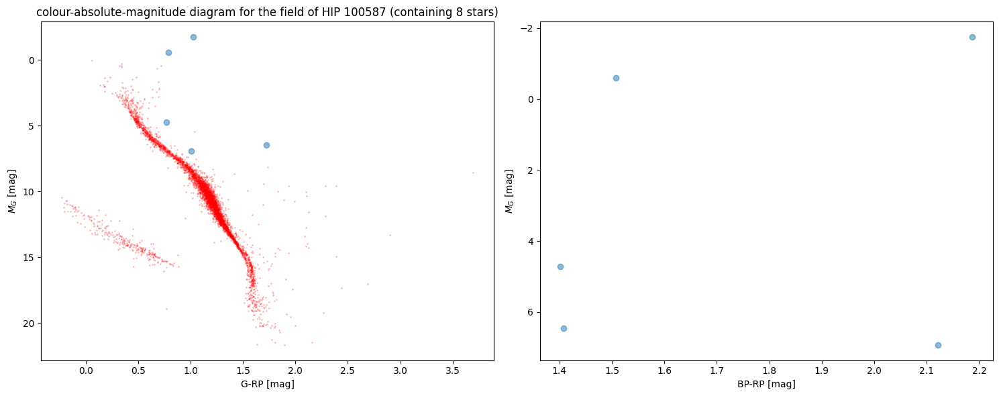

In [ ]:
fig, axs = plt.subplots(1, 2, figsize=(15, 6))

axs[0].scatter(df['G-RP'], df['absolute Gmag'], alpha=0.5)
axs[0].scatter(df_cns5['g_rp_resulting'], df_cns5['absolute Gmag CNS5'], alpha=0.2, color='red', s=1)
axs[0].invert_yaxis()  # Invert y-axis for the left plot
axs[0].set_xlabel('G-RP [mag]')
axs[0].set_ylabel(r'$M_G$ [mag]')
axs[0].set_title(f'colour-absolute-magnitude diagram for the field of HIP 100587 (containing {len(df)} stars)')

axs[1].scatter(df['BP-RP'], df['absolute Gmag'], alpha=0.5)
axs[1].invert_yaxis()
axs[1].set_xlabel('BP-RP [mag]')
axs[1].set_ylabel(r'$M_G$ [mag]')

plt.tight_layout()

In [ ]:
plt.scatter?


# Maybe detect bright star alone and query results alone. This would allow to use smaller radii for faint stars

In [ ]:
# Gaia DR3
all_results = []
empty_column = Column(name='Position Number', data=[None])
x_column = Column(name='x', data=[None])
y_column = Column(name='y', data=[None])

for i, position in enumerate(positions):
    sky = w.pixel_to_world(*position)
    star_coords = SkyCoord(ra=sky.ra, dec=sky.dec, frame='icrs', unit=(u.deg, u.deg))
    if i % 50 == 0:
      print(i)
    viz = Vizier(columns=['DR3Name', 'RAJ2000', 'DEJ2000', 'BPmag','e_BPmag', 'RPmag', 'e_RPmag' ]) # params for gaia
    result = viz.query_region(star_coords, radius=2.5 * u.arcsecond, catalog='I/355 ') #gaia dr3
    # Check and select the entry with the lowest magnitude
    if result is not None and len(result) > 0:
        min_mag_idx = None
        min_mag = float('inf')

        # Find the entry with the lowest magnitude
        for idx, row in enumerate(result[0]):
            if row['BPmag'] < min_mag:
                min_mag = row['BPmag']
                min_mag_idx = idx
            if row['RPmag'] < min_mag:
                min_mag = row['RPmag']
                min_mag_idx = idx

        # If a minimum magnitude entry is found, update the values
        if min_mag_idx is not None:
            # Use .copy() to avoid modifying the original columns
            result[0]['Position Number'] = empty_column.copy()
            result[0]['x'] = x_column.copy()
            result[0]['y'] = y_column.copy()
            # Update the values for the current iteration
            result[0]['Position Number'][min_mag_idx] = i + 1
            result[0]['x'][min_mag_idx] = position[0]
            result[0]['y'][min_mag_idx] = position[1]

            all_results.append(result[0][min_mag_idx])

final_table_gaia = vstack(all_results)
print("Final Merged Table:")
print("Number of rows:", len(final_table_gaia))
final_table_gaia.pprint(max_lines=-1, max_width=-1)
# Save the table as a CSV file without header and using ';' as a delimiter

0
50
100
150
200
250
300


Final Merged Table:
Number of rows: 310
          DR3Name                RAJ2000         DEJ2000       BPmag    e_BPmag    RPmag    e_RPmag  Position Number         x                  y         
                                   deg             deg          mag       mag       mag       mag                                                         
---------------------------- --------------- --------------- --------- --------- --------- --------- --------------- ------------------ ------------------
Gaia DR3 2054252728498404096 305.76706095174  32.16078245411 14.495131  0.004409 13.491587  0.004713               1   72.3664007424267  853.0532150282611
Gaia DR3 2054252316181517568 305.77036170937  32.11493605165 15.238069  0.003114 13.497399  0.003932               2  88.29634288997346  603.9818677027345
Gaia DR3 2054250563834814848 305.77312048613  32.01956348212 16.279392  0.004007 13.975838  0.003832               3 102.24728362956324  85.08914995464644
Gaia DR3 2054351272227274752 3

In [ ]:
print(len(final_table_gaia))

310


In [ ]:
# gaia without sorting
w = WCS(header)

all_results = []  # List to hold individual query results

for i, position in enumerate(positions):
    sky = w.pixel_to_world(*position)

    # Create SkyCoord object for the star
    star_coords = SkyCoord(ra=sky.ra, dec=sky.dec, frame='icrs', unit=(u.deg, u.deg))


    # Query VizieR for magnitudes
    viz = Vizier(columns=['DR2Name', 'RAJ2000', 'DEJ2000', 'BPmag', 'RPmag' ]) # params for gaia
    result = viz.query_region(star_coords, radius = 2* u.arcsecond, catalog='I/345 ') #gaia dr2


    # Append the individual result to the list
    if result is not None and len(result) > 0:
        result[0]['Position Number'] = i + 1
        all_results.append(result[0])

    # Print coordinates for the star
    #print(f"Star {i}: {star_coords.to_string(style='hmsdms')}")


# Merge all individual result tables into one
final_table = vstack(all_results)

# Print the final merged table
print("")
print("Final Merged Table:")
final_table.pprint(max_lines=-1, max_width=-1)


Final Merged Table:
          DR2Name                RAJ2000         DEJ2000      BPmag   RPmag  Position Number
                                   deg             deg         mag     mag                  
---------------------------- --------------- --------------- ------- ------- ---------------
Gaia DR2 2054252728498404096 305.76705816600  32.16078797950 14.5081 13.5037               1
Gaia DR2 2054252694126343424 305.76679440700  32.16064464590      --      --               1
Gaia DR2 2054252316181517568 305.77036170600  32.11493598450 15.2586 13.5073               2
Gaia DR2 2054250563834814848 305.77312108500  32.01956304860 16.2845 13.9831               3
Gaia DR2 2054351272227274752 305.77448835900  32.30662904440 16.3917 15.1478               4
Gaia DR2 2054252414949689344 305.77843464300  32.13927539350 16.2563 14.6911               5
Gaia DR2 2054351272227271808 305.78001912900  32.29855609230 15.4646 14.1699               6
Gaia DR2 2054252247462023936 305.78218529400  32.

In [ ]:
all_coordinates = []
all_results = []

for i, pixel_coords in enumerate(positions):
    sky = w.pixel_to_world(*pixel_coords)

    # Create SkyCoord object for the star
    star_coords = SkyCoord(ra=sky.ra, dec=sky.dec, frame='icrs', unit=(u.deg, u.deg))
    all_coordinates.append(star_coords.to_string(style='hmsdms'))

    customSimbad = Simbad()
    customSimbad.add_votable_fields('flux(B)', 'flux(V)', 'flux(R)')
    result_table = customSimbad.query_region(star_coords, radius=3 * u.arcsecond)

    # Append the individual result to the list
    if result_table is not None:
        result_table['Position Number'] = i + 1
        all_results.append(result_table)

    #print(f"Star {i + 1}: {star_coords.to_string(style='hmsdms')}")

for i in range (len(all_coordinates)):
  print(f"star {i}: {all_coordinates[i]}")


# Merge all individual result tables into one
final_table_simbad = vstack(all_results)
# Reorder columns to make 'Number' the first column
cols = final_table_simbad.colnames
cols = ['Position Number'] + [col for col in cols if col != 'Position Number']
final_table_simbad = final_table_simbad[cols]

print("")
print("")
final_table_simbad.pprint(max_lines=-1, max_width=-1)


/usr/local/lib/python3.10/dist-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:23:04.02530155 +32:09:37.85291689': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/usr/local/lib/python3.10/dist-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:23:04.84649805 +32:06:53.24763069': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/usr/local/lib/python3.10/dist-packages/astroquery/simbad/core.py:135: UserWarning: Warning: The script line number 3 raised an error (recorded in the `errors` attribute of the result table): '20:23:05.55602894 +32:01:10.35195589': No astronomical object found :
  warnings.warn("Warning: The script line number %i raised "
/usr/local/lib/python3.10/di

star 0: 20h23m04.02530155s +32d09m37.85291689s
star 1: 20h23m04.84649805s +32d06m53.24763069s
star 2: 20h23m05.55602894s +32d01m10.35195589s
star 3: 20h23m05.7894713s +32d18m23.01924389s
star 4: 20h23m06.79336159s +32d08m20.73586236s
star 5: 20h23m07.10616654s +32d17m54.01980235s
star 6: 20h23m07.70854924s +32d06m05.38502869s
star 7: 20h23m08.0977826s +32d15m35.51277937s
star 8: 20h23m08.34611527s +32d13m15.4510883s
star 9: 20h23m08.68942097s +32d07m41.21478177s
star 10: 20h23m09.01647673s +32d18m24.48572313s
star 11: 20h23m09.01364223s +32d08m21.06482313s
star 12: 20h23m08.99663667s +32d02m46.72741328s
star 13: 20h23m09.08860938s +32d19m38.31300999s
star 14: 20h23m09.19906155s +32d14m00.51784294s
star 15: 20h23m09.70576599s +32d00m59.11528935s
star 16: 20h23m09.83370909s +32d12m11.02393511s
star 17: 20h23m10.26163833s +32d20m11.5483867s
star 18: 20h23m11.23679685s +32d02m18.73111453s
star 19: 20h23m11.60184992s +32d13m45.40053035s
star 20: 20h23m11.67474827s +32d01m07.45217842s
star 2



Position Number        MAIN_ID              RA           DEC      RA_PREC DEC_PREC COO_ERR_MAJA COO_ERR_MINA COO_ERR_ANGLE COO_QUAL COO_WAVELENGTH     COO_BIBCODE     FLUX_B FLUX_V FLUX_R SCRIPT_NUMBER_ID
                                         "h:m:s"       "d:m:s"                         mas          mas           deg                                                   mag    mag    mag                   
--------------- --------------------- ------------- ------------- ------- -------- ------------ ------------ ------------- -------- -------------- ------------------- ------ ------ ------ ----------------
             25             HD 332199 20 23 13.3564 +32 18 05.779      14       14        0.016        0.019            90        A              O 2020yCat.1350....0G  10.76  10.84     --                1
             41       TYC 2676-1544-1 20 23 20.0256 +32 02 08.923      14       14        0.007        0.009            90        A              O 2020yCat.1350....0G  12.58  12.

# Compare Simbad with Gaia

In [ ]:
position_numbers_simbad = final_table_simbad[final_table_simbad.colnames[0]].data.tolist()
b_mag_simbad = final_table_simbad[final_table_simbad.colnames[12]].data.tolist()
pos_mag_simbad = [(pos,mag) for pos, mag in zip(position_numbers_simbad, b_mag_simbad)]
print(pos_mag_simbad)

position_numbers_gaia = final_table_gaia[final_table_gaia.colnames[5]].data.tolist()
b_mag_gaia = final_table_gaia[final_table_gaia.colnames[3]].data.tolist()
pos_mag_gaia = [(pos,mag) for pos, mag in zip(position_numbers_gaia, b_mag_gaia)]
print(pos_mag_gaia)

[(1, 14.5081), (2, 15.2586), (3, 16.2845), (4, 16.3917), (5, 16.2563), (6, 15.4646), (7, 13.1955), (8, 15.8685), (9, 14.2013), (10, 15.6092), (11, 15.4291), (12, 12.565), (13, 16.2428), (14, 15.6998), (15, 16.4074), (16, 15.8922), (17, 15.6176), (18, 15.1606), (19, 15.2487), (20, 16.1495), (21, 15.4324), (22, 15.8129), (23, 15.8259), (24, 15.3533), (25, 10.6761), (26, 15.055), (27, 14.2819), (28, 14.7031), (29, 15.1557), (30, 15.5531), (32, 14.8134), (33, 14.5646), (34, 16.506), (35, 14.9572), (36, 16.1494), (37, 14.9846), (38, 14.0426), (39, 16.0607), (40, 15.7112), (41, 12.5375), (42, 15.2714), (43, 15.7748), (44, 15.7182), (45, 14.5514), (46, 15.8578), (47, 9.3775), (48, 14.4703), (49, 13.082), (50, 14.5615), (51, 14.0984), (52, 15.9783), (53, 12.7678), (54, 14.8915), (55, 14.7721), (56, 14.628), (57, 15.9316), (58, 15.5519), (59, 15.8903), (60, 13.1028), (61, 15.2635), (62, 15.1806), (63, 13.3927), (64, 14.9064), (65, 16.3061), (66, 13.4167), (67, 15.4861), (68, 15.9662), (69, 14.3

In [ ]:
diff_mag_simbad, diff_mag_gaia = [], []

for i in range (len(pos_mag_simbad)):
  n = pos_mag_simbad[i][0] #wanted position number
  for j in range (len(pos_mag_gaia)):
    if pos_mag_gaia[j][0] == n:
      reference_index = j
  if pos_mag_simbad[i][1] is not None:
      d1 = pos_mag_simbad[i][1] - pos_mag_simbad[6][1] # 6 is index for HIP10587 in simbad
      d2 = pos_mag_gaia[reference_index][1] - pos_mag_gaia[122][1] #122 is HIP100587 in gaia
      diff_mag_simbad.append(round(d1,2))
      diff_mag_gaia.append(round(d2,2))


print(len(diff_mag_simbad))
print(diff_mag_simbad)
print(diff_mag_gaia)
print(np.mean(diff_mag_simbad))
print(np.mean(diff_mag_gaia))

16
[4.99, 6.81, 4.35, 7.18, 5.93, 0.0, 6.56, 3.71, 5.73, 6.38, 5.9, 4.81, 5.54, 3.72, 3.85, 5.99]
[5.97, 7.83, 4.67, 8.23, 5.91, 0.0, 7.52, 4.52, 6.33, 7.21, 6.96, 4.8, 6.24, 4.67, 4.55, 7.03]
5.090624999999999
5.7775


In [ ]:
all_coordinates = []

for i, pixel_coords in enumerate(positions):
    sky = w.pixel_to_world(*pixel_coords)
    star_coords = SkyCoord(ra=sky.ra, dec=sky.dec, frame='icrs', unit=(u.deg, u.deg))
    all_coordinates.append(star_coords.to_string(style='hmsdms'))

split_coordinates = [coord.split(' ') for coord in all_coordinates]
RA = [split[0] for split in split_coordinates]
DEC = [split[1] for split in split_coordinates]

data = {
    'ID': [i+1 for i in range(len(positions))],
    'X': [pos[0] for pos in positions],
    'Y': [pos[1] for pos in positions],
    'ra': RA,
    'dec': DEC,
    'flux': aperture_sum_list
}

df = pd.DataFrame(data)
display(df)

# save data to csv
df.to_csv('/content/drive/MyDrive/Bachelor/data/Coordinates Files/positions_'+ target_name +'.csv', index=False)

,ID,X,Y,ra,dec,flux
0,1,72.366401,853.053215,20h23m04.02530155s,+32d09m37.85291689s,10786.046035
1,2,88.296343,603.981868,20h23m04.84649805s,+32d06m53.24763069s,3490.527170
2,3,102.247284,85.089150,20h23m05.55602894s,+32d01m10.35195589s,957.961352
3,4,105.537288,1647.799471,20h23m05.7894713s,+32d18m23.01924389s,1699.971057
4,5,125.580635,736.437787,20h23m06.79336159s,+32d08m20.73586236s,1788.373684
...,...,...,...,...,...,...
305,306,1972.389124,1915.328224,20h24m43.31818612s,+32d21m15.53535959s,2637.566407
306,307,1972.916385,1627.154094,20h24m43.25633951s,+32d18m04.99870027s,20300.452891
307,308,1973.692971,1502.411954,20h24m43.25851789s,+32d16m42.51985887s,8519.484124
308,309,1974.773269,207.086736,20h24m42.92947823s,+32d02m26.12660575s,895.443655


In [ ]:
#### panstars catalog (ps1)

w = WCS(header)

all_results = []  # List to hold individual query results

for i, position in enumerate(positions):
    sky = w.pixel_to_world(*position)

    # Create SkyCoord object for the star
    star_coords = SkyCoord(ra=sky.ra, dec=sky.dec, frame='icrs', unit=(u.deg, u.deg))


    # Query VizieR for magnitudes
    viz = Vizier(columns=['objID', 'RAJ2000', 'DEJ2000', 'rmag' ]) # params for II/349, also possible , 'e_rmag'
    #viz = Vizier()
    #result = viz.query_region(star_coords, radius= 2 * u.arcsecond, catalog='II/246')
    #result = viz.query_region(star_coords, radius= 3 * u.arcsecond, catalog='V/147')
    result = viz.query_region(star_coords, radius = 1* u.arcsecond, catalog='II/349') # panstars catalog (ps1)


    # Append the individual result to the list
    if result is not None and len(result) > 0:
        result[0]['Position Number'] = i + 1
        all_results.append(result[0])

    # Print coordinates for the star
    #print(f"Star {i}: {star_coords.to_string(style='hmsdms')}")

# Merge all individual result tables into one
final_table = vstack(all_results)

# Print the final merged table
print("Final Merged Table:")
final_table.pprint(max_lines=-1, max_width=-1)

Final Merged Table:
      objID           RAJ2000       DEJ2000      rmag  Position Number
                        deg           deg        mag                  
------------------ ------------- ------------- ------- ---------------
146593057670483452 305.767023390  32.160701910 14.1174               1
146533057703418568 305.770343840  32.114920120 14.4859               2
146423057731174112 305.773097400  32.019544110 15.3196               3
146563057784467771 305.778443710  32.139248530 15.5907               5
146523057820882464 305.782203270  32.101520190 13.1040               7
146553057863854560 305.786393660  32.128244620 14.6141              10
146563057878157775 305.787765390  32.139360890 12.3620              12
146453057875376273 305.787529890  32.046353860 15.6295              13
146423057904480339 305.790441480  32.016409880 15.1613              16
146443057968906877 305.796839000  32.038523740 14.7321              19
146673057986205943 305.798603820  32.229438750 15.5567   

Coordiantes from simbad for brightest = 10 in HIP100587

1.   20 23 13.3564526904 +32 18 05.779994004  
2.   20 23 21.8380410672 +32 03 58.084268292
3.   20 23 51.6137972268 +32 11 24.481643174
4.   20 24 03.2223323343 +32 05 32.645032187
5.   20 24 22.7179572960 +32 06 54.676656864
6.   20 24 32.1180894048 +32 01 00.081415740
7.   20 24 33.3766244904 +32 12 28.787834016





In [51]:
'''
#pip install astroalign
import astroalign as aa

def determine_shift_aa(imageList, referenceImage = None, wanted_index = None):
    print('Number of images to process:', len(imageList))
    shifts = []

    if referenceImage is None:
        if wanted_index is None:
          wanted_index = len(imageList)//2
        print('we use image: ',wanted_index,"from given list as reference image (keep in mind numbers star at 0)")
        reference_image = imageList[wanted_index].astype(np.float32)
    else:
        reference_image = referenceImage.astype(np.float32)

    for i, image in enumerate(imageList):
      if i == wanted_index:
        shifts.append((0,0)) #no shift for the reference image relativ to itself
      else:
        source = image.astype(np.float32)
        #registered_image, footprint = aa.register(source, reference_image) #target is reference image
        transf, (source_list, target_list) = aa.find_transform(source, reference_image)
        translation_params = transf.params  # Get parameters of the transformation
        shift_x = translation_params[0, 2]
        shift_y = translation_params[1,2]
        #shift_x, shift_y = warp_matrix[0, 2], warp_matrix[1, 2]
        shifts.append((shift_x, shift_y))
    return shifts

    #return shifts
shifts_long = determine_shift_aa(image_list_long)
print(shifts_long)
'''

'\n#pip install astroalign\nimport astroalign as aa\n\ndef determine_shift_aa(imageList, referenceImage = None, wanted_index = None):\n    print(\'Number of images to process:\', len(imageList))\n    shifts = []\n\n    if referenceImage is None:\n        if wanted_index is None:\n          wanted_index = len(imageList)//2\n        print(\'we use image: \',wanted_index,"from given list as reference image (keep in mind numbers star at 0)")\n        reference_image = imageList[wanted_index].astype(np.float32)\n    else:\n        reference_image = referenceImage.astype(np.float32)\n\n    for i, image in enumerate(imageList):\n      if i == wanted_index:\n        shifts.append((0,0)) #no shift for the reference image relativ to itself\n      else:\n        source = image.astype(np.float32)\n        #registered_image, footprint = aa.register(source, reference_image) #target is reference image\n        transf, (source_list, target_list) = aa.find_transform(source, reference_image)\n        tr